In [1]:
import json
import numpy as np
from tqdm import tqdm
import os
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np
from scipy.optimize import least_squares
from scipy.special import erf
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales

In [2]:
index = {}

with open("observability_bright.json", "rb") as f:
    while True:
        pos = f.tell()
        line = f.readline()

        if not line:
            break

        s = line.strip()

        if s in (b"", b"{", b"}"):
            continue

        # key is before first colon
        key_bytes = s.split(b":", 1)[0]
        key = json.loads(key_bytes.decode())

        index[int(key)] = pos

print("nkeys:", len(index))

def load_observability_key(filename, index, key):
    key = int(key)

    with open(filename, "rb") as f:
        f.seek(index[key])
        line = f.readline().decode().strip()

    if line.endswith(","):
        line = line[:-1]

    rec = json.loads("{" + line + "}")
    return np.asarray(rec[str(key)])

nkeys: 51190


In [3]:
def generate_trail(shape, flux, x0, y0, length, theta, sigma, background=0.0):
    ny, nx = shape
    y, x = np.mgrid[0:ny, 0:nx]
    xp = (x - x0) * np.cos(theta) + (y - y0) * np.sin(theta)
    yp = -(x - x0) * np.sin(theta) + (y - y0) * np.cos(theta)
    prefactor = flux / (length * 2.0 * sigma * np.sqrt(2.0 * np.pi))
    cross_trail = np.exp(-(yp ** 2) / (2.0 * sigma ** 2))
    u1 = (xp + length / 2.0) / (sigma * np.sqrt(2.0))
    u2 = (xp - length / 2.0) / (sigma * np.sqrt(2.0))
    along_trail = erf(u1) - erf(u2)
    return background + prefactor * cross_trail * along_trail


def fit_trail(image, p0, bounds=None):
    ny, nx = image.shape

    def residuals(params):
        flux, x0, y0, length, theta, sigma, background = params
        if length <= 0 or sigma <= 0 or flux < 0:
            return np.full(image.size, 1e30)
        model = generate_trail(image.shape, flux, x0, y0, length, theta, sigma, background)
        return (model - image).ravel()

    if bounds is None:
        lower = [0.0, 0.0, 0.0, 1e-6, -np.pi, 1e-3, -np.inf]
        upper = [np.inf, nx, ny, max(nx, ny), np.pi, np.inf, np.inf]
        bounds = (lower, upper)

    result = least_squares(residuals, p0, bounds=bounds)
    best_fit = {"flux": result.x[0], "x0": result.x[1], "y0": result.x[2], "length": result.x[3], "theta": result.x[4], "sigma": result.x[5], "background": result.x[6]}
    model = generate_trail(image.shape, best_fit["flux"], best_fit["x0"], best_fit["y0"], best_fit["length"], best_fit["theta"], best_fit["sigma"], best_fit["background"])
    return result, best_fit, model

In [4]:
mpcnum = 1
obs = load_observability_key("observability_bright.json", index, mpcnum)
print(obs.shape)
print(obs[:10])

(6263, 7)
[['243.33128' '-12.933481' '2.2607365' '2.6862247' '2411433.917859954'
  'i00768' '7.246961421394394']
 ['230.25215' '-15.6733885' '2.193429' '2.7920167' '2411565.614578704'
  'i01460' '7.265207963672594']
 ['339.79263' '-19.649696' '2.4535859' '2.9757347' '2411898.912928241'
  'b06327' '7.646977382690467']
 ['340.133' '-19.848923' '2.4063885' '2.9764988' '2411902.8112824075'
  'b06363' '7.605357276225835']
 ['340.40335' '-20.092997' '2.3588226' '2.9772534' '2411906.865460648'
  'b06387' '7.562555400081958']
 ['340.40387' '-20.09358' '2.3587186' '2.977255' '2411906.874462963'
  'b06388' '7.562460825168908']
 ['340.1122' '-22.242989' '2.1230605' '2.9808629' '2411930.759415509'
  'b06561' '7.336521860361453']
 ['50.76535' '12.331429' '1.8360833' '2.759565' '2412438.656556713'
  'i07633' '6.853665043017613']
 ['50.00687' '12.441715' '1.8578041' '2.756414' '2412442.6348993056'
  'i07647' '6.876721820241446']
 ['48.881805' '12.694613' '1.9050819' '2.7508905' '2412449.6057453705'
 

124630.29278282025
[124630.29278282025, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 3246.0]


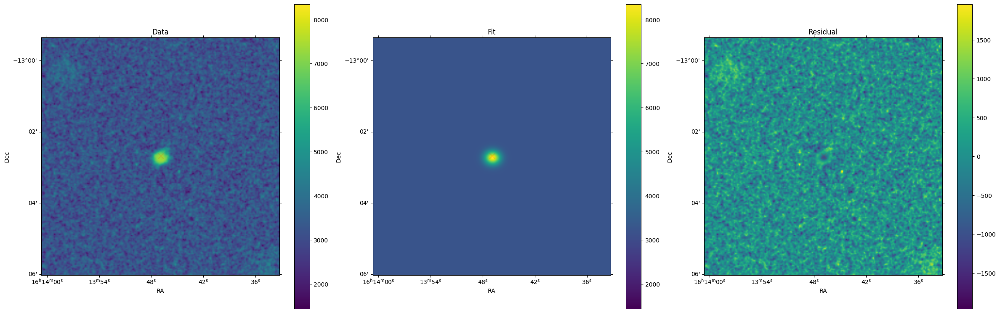

80780.01275666307
[80780.01275666307, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 5110.0]


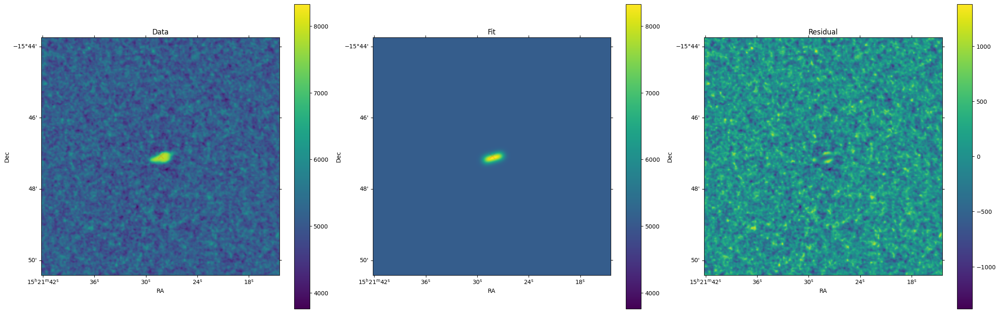

70595.6265617527
[70595.6265617527, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 3753.0]


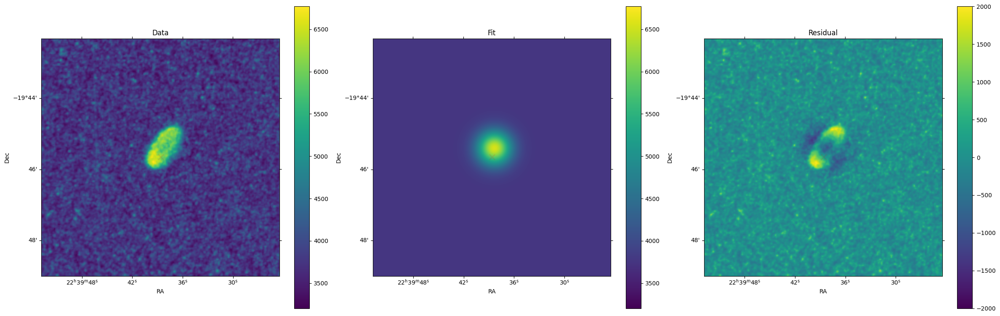

74675.42518582658
[74675.42518582658, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 3761.0]


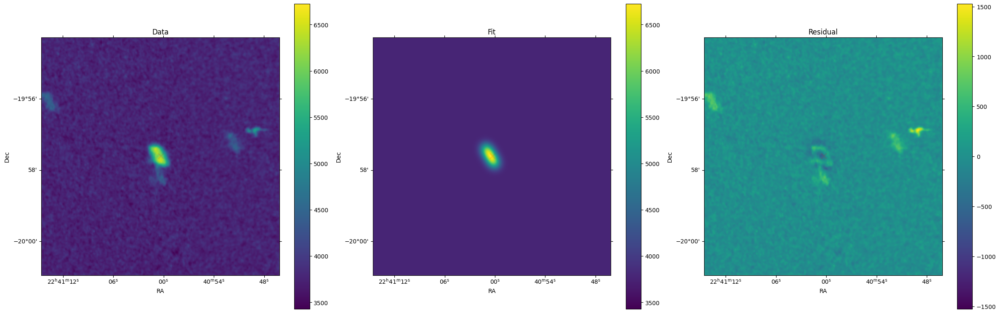

78060.1470072805
[78060.1470072805, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 4483.0]


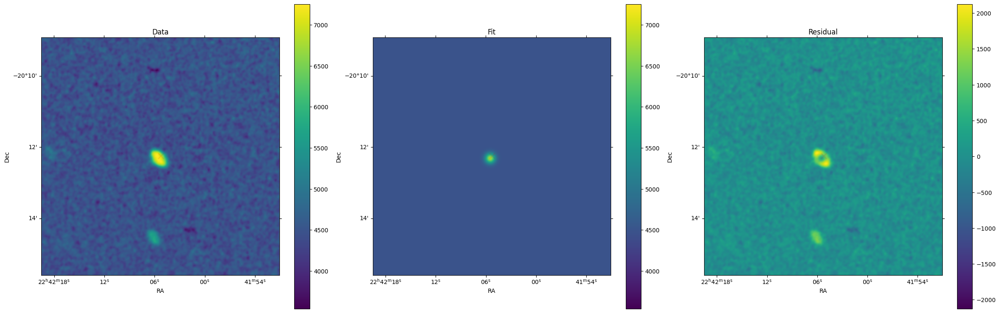

87005.48324969436
[87005.48324969436, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 3711.0]


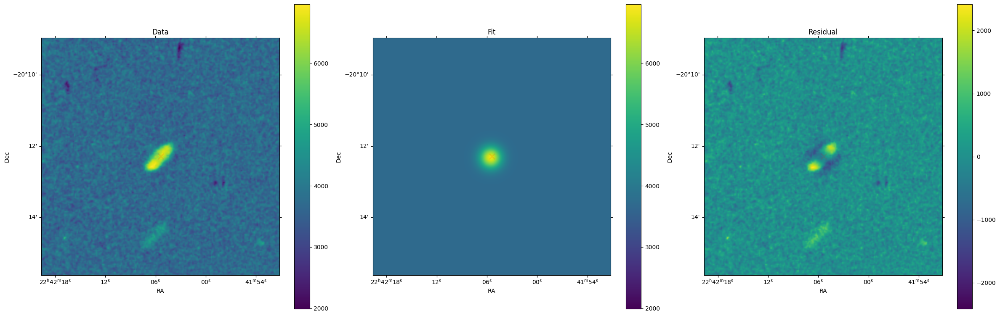

94711.7695396117
[94711.7695396117, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 3183.0]


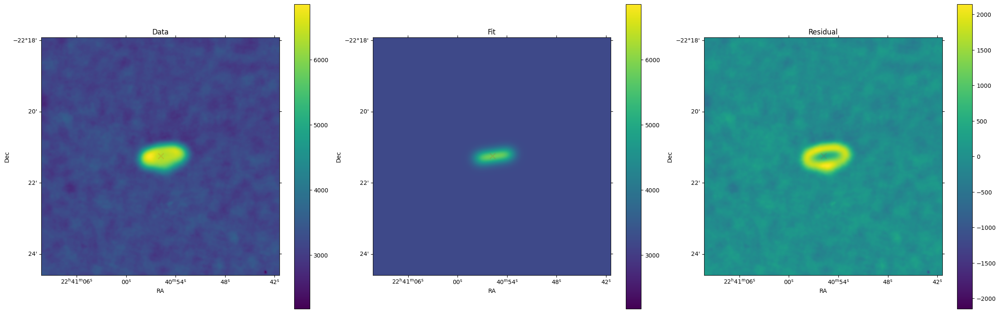

132548.12418657847
[132548.12418657847, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 3413.0]


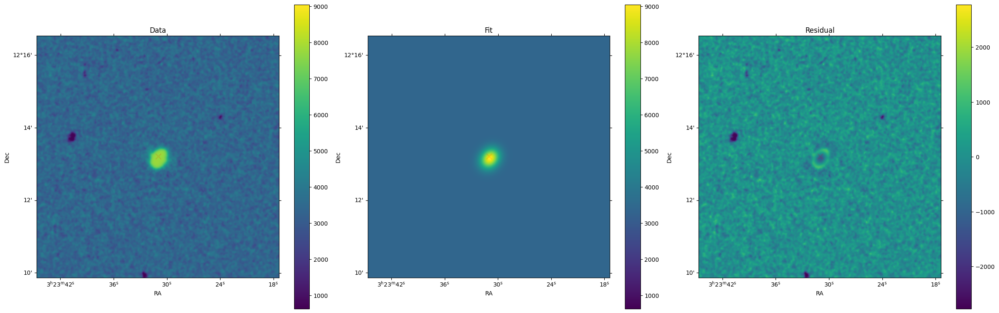

118163.0564453994
[118163.0564453994, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 3943.0]


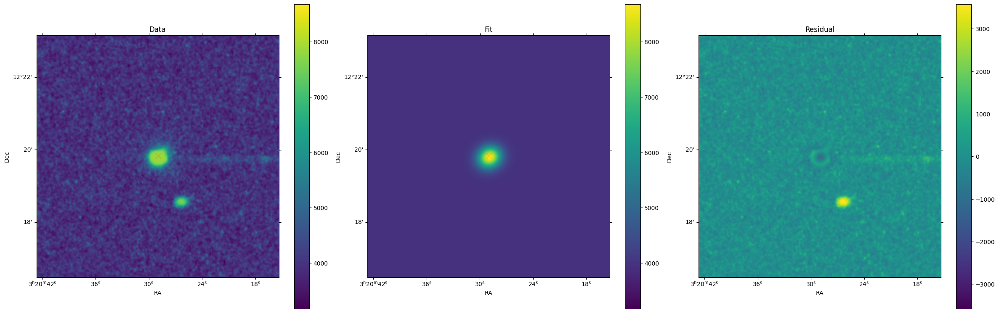

127924.35241262805
[127924.35241262805, 139.0, 138.99999999999125, 2.0, 0.03490658503988659, 3.472222222222222, 3468.0]


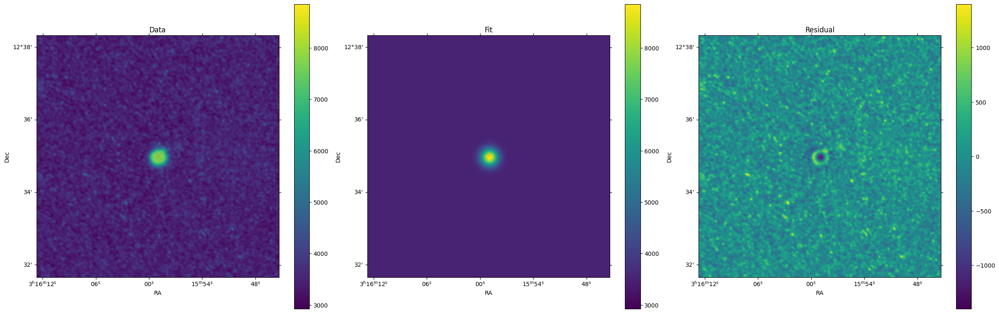

In [5]:
fit_results = []
preds = []

for i in range(10): #loop over the images, plot and fit them!
    ra, dec, rearth, rsun, jd, plate_id, vmag = obs[i]
    preds.append([ra,dec,vmag])
    fits_path = f"./{mpcnum}/{mpcnum}_{plate_id}.fits"
    hdul = fits.open(fits_path)
    hdu = next(h for h in hdul if h.data is not None)

    raw_image = hdu.data
    
    ny, nx = raw_image.shape
    N = 3

    y0, y1 = ny // N, (N - 1) * ny // N
    x0, x1 = nx // N, (N - 1) * nx // N
    image = raw_image[y0:y1, x0:x1]


    wcs = WCS(hdu.header)

    pixscale_arcsec = np.mean(proj_plane_pixel_scales(wcs)) * 3600.0  #check this 
    sigma_arcsec = 5.0
    sigma_pix = sigma_arcsec / pixscale_arcsec

    x_pred_raw, y_pred_raw = wcs.world_to_pixel_values(float(ra), float(dec))
    x_pred = x_pred_raw - x0
    y_pred = y_pred_raw - y0    

    ny, nx = image.shape

    peak_flux = image[int(y_pred), int(x_pred)] - np.median(image) 
    length0 = sigma_pix
    flux0 = peak_flux * length0 * np.sqrt(2 * np.pi) * sigma_pix #compute a rough peak-flux based on a circular guess
    
    print(flux0)


    p0 = [
        np.max([flux0,0]),            # use my peak flux guess (or zero if negative)
        x_pred,            # x0
        y_pred,            # y0
        2.0,              # length (set to sigma_pix for now - maight change later)
        np.deg2rad(2.0),  # theta (random for now, mighth change later)
        sigma_pix,         # sigma go for roughly 5 arcsec
        np.median(image),  # background
    ]
    print(p0)

    result, best_fit, model = fit_trail(image, p0)
    resid = image - model

    #fit_ra, fit_dec = wcs.pixel_to_world_values(best_fit['x0'],best_fit['y0'])
    fit_ra, fit_dec = wcs.pixel_to_world_values(best_fit['x0'] + x0,best_fit['y0'] + y0)

    fig, axes = plt.subplots(1, 3, figsize=(24, 8), subplot_kw={"projection": wcs})
    vmin = min(np.min(image), np.min(model))
    vmax = max(np.max(image), np.max(model))
    rmax = np.max(np.abs(resid))

    im0 = axes[0].imshow(image, origin="lower", vmin=vmin, vmax=vmax)
    axes[0].set_title("Data")
    fig.colorbar(im0, ax=axes[0])

    im1 = axes[1].imshow(model, origin="lower", vmin=vmin, vmax=vmax)
    axes[1].set_title("Fit")
    fig.colorbar(im1, ax=axes[1])

    im2 = axes[2].imshow(resid, origin="lower", vmin=-rmax, vmax=rmax)
    axes[2].set_title("Residual")
    fig.colorbar(im2, ax=axes[2])

    for ax in axes:
        ax.scatter(x_pred, y_pred, marker="x", c="red", s=90, linewidths=2, transform=ax.get_transform("pixel"),alpha=0.1)

    plt.tight_layout()

    for ax in axes:
        ax.set_xlabel("RA")
        ax.set_ylabel("Dec")

    plt.tight_layout()
    plt.show()
    
    fit_results.append([result,best_fit,model,[fit_ra,fit_dec,best_fit['flux']]])

In [6]:
fits = np.array([f[-1] for f in fit_results]).astype(float)
preds = np.array(preds).astype(float)

In [7]:
fit_ra, fit_dec, fit_flux = fits.T
pred_ra, pred_dec, pred_mag = preds.T

dra = (fit_ra - pred_ra) * 3600.0 * np.cos(np.deg2rad(pred_dec))  # arcsec
ddec = (fit_dec - pred_dec) * 3600.0                              # arcsec

t = np.arange(len(dra))

In [8]:
fit_ra-pred_ra

array([-0.00010143, -0.00043671, -0.00098077,  0.00105863,  0.00110017,
        0.00082026, -0.00088932, -0.00024325, -0.00026043, -0.00028619])

In [9]:
fit_dec-pred_dec

array([-8.41007802e-04, -9.11208139e-04,  4.12529190e-03,  3.37133384e-05,
       -1.13381360e-03, -7.62447936e-04, -1.38636853e-04, -9.91009249e-04,
       -6.15887221e-04, -6.58949666e-04])

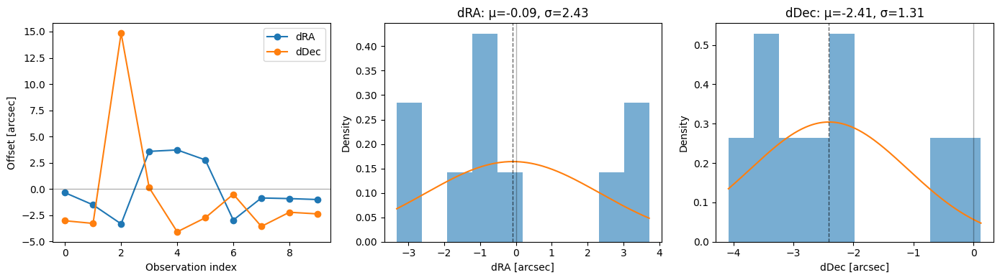

dRA  mean = -0.086 arcsec
dRA  std  = 2.432 arcsec
dDec mean = -2.408 arcsec
dDec std  = 1.312 arcsec
dRA  clipped 0 / 10 points
dDec clipped 1 / 10 points


In [10]:
from scipy.stats import norm

fig, axes = plt.subplots(1, 3, figsize=(14, 4))

ax = axes[0]
ax.plot(t, dra, marker="o", label="dRA")
ax.plot(t, ddec, marker="o", label="dDec")
ax.axhline(0, color="k", lw=1, alpha=0.3)
ax.set_xlabel("Observation index")
ax.set_ylabel("Offset [arcsec]")
ax.legend()

clip = 3.0

dra_med = np.median(dra)
dra_sig = 1.4826 * np.median(np.abs(dra - dra_med))
dra_clip = dra[np.abs(dra - dra_med) < clip * dra_sig]

ddec_med = np.median(ddec)
ddec_sig = 1.4826 * np.median(np.abs(ddec - ddec_med))
ddec_clip = ddec[np.abs(ddec - ddec_med) < clip * ddec_sig]

dra_mu, dra_std = norm.fit(dra_clip)
ddec_mu, ddec_std = norm.fit(ddec_clip)

axes[1].hist(dra_clip, bins=10, density=True, alpha=0.6)
x = np.linspace(np.min(dra_clip), np.max(dra_clip), 200)
axes[1].plot(x, norm.pdf(x, dra_mu, dra_std))
axes[1].axvline(0, color="k", lw=1, alpha=0.3)
axes[1].axvline(dra_mu, color="k", lw=1, ls="--", alpha=0.6)
axes[1].set_xlabel("dRA [arcsec]")
axes[1].set_ylabel("Density")
axes[1].set_title(f"dRA: μ={dra_mu:.2f}, σ={dra_std:.2f}")

axes[2].hist(ddec_clip, bins=10, density=True, alpha=0.6)
x = np.linspace(np.min(ddec_clip), np.max(ddec_clip), 200)
axes[2].plot(x, norm.pdf(x, ddec_mu, ddec_std))
axes[2].axvline(0, color="k", lw=1, alpha=0.3)
axes[2].axvline(ddec_mu, color="k", lw=1, ls="--", alpha=0.6)
axes[2].set_xlabel("dDec [arcsec]")
axes[2].set_ylabel("Density")
axes[2].set_title(f"dDec: μ={ddec_mu:.2f}, σ={ddec_std:.2f}")

plt.tight_layout()
plt.show()

print(f"dRA  mean = {dra_mu:.3f} arcsec")
print(f"dRA  std  = {dra_std:.3f} arcsec")
print(f"dDec mean = {ddec_mu:.3f} arcsec")
print(f"dDec std  = {ddec_std:.3f} arcsec")

print(f"dRA  clipped {len(dra) - len(dra_clip)} / {len(dra)} points")
print(f"dDec clipped {len(ddec) - len(ddec_clip)} / {len(ddec)} points")

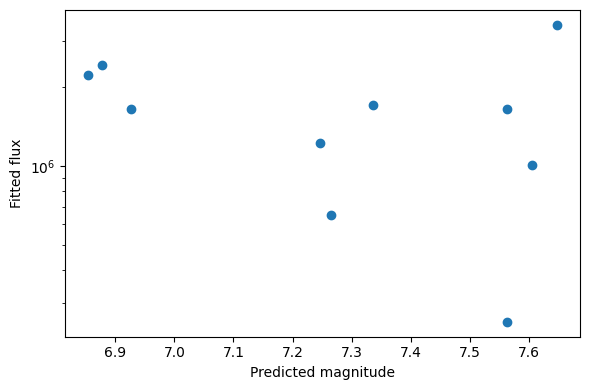

In [11]:
fig, ax = plt.subplots(figsize=(6, 4))

ax.scatter(pred_mag, fit_flux)
ax.set_yscale("log")

ax.set_xlabel("Predicted magnitude")
ax.set_ylabel("Fitted flux")

plt.tight_layout()
plt.show()

## Astrometric Error Plots
Separate RA and Dec error plots over observation index, and error vs predicted magnitude.

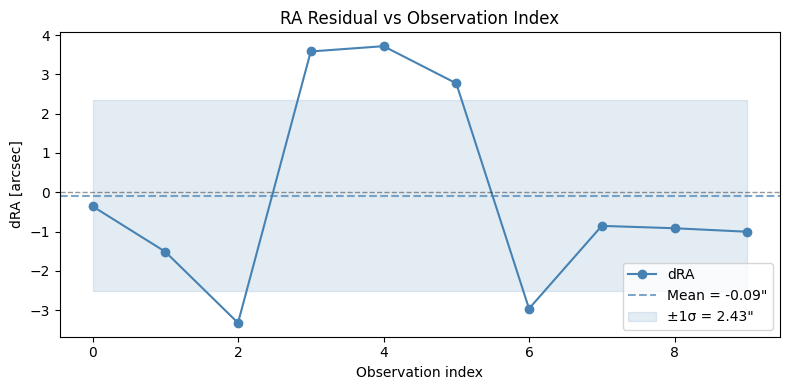

In [12]:
# Plot: dRA error vs observation index
fig, ax = plt.subplots(figsize=(8, 4))

ax.plot(t, dra, marker='o', color='steelblue', label='dRA')
ax.axhline(0, color='k', lw=1, alpha=0.4, ls='--')
ax.axhline(dra_mu, color='steelblue', lw=1.5, ls='--', alpha=0.7, label=f'Mean = {dra_mu:.2f}"')
ax.fill_between(t, dra_mu - dra_std, dra_mu + dra_std, alpha=0.15, color='steelblue', label=f'±1σ = {dra_std:.2f}"')

ax.set_xlabel('Observation index')
ax.set_ylabel('dRA [arcsec]')
ax.set_title('RA Residual vs Observation Index')
ax.legend()
plt.tight_layout()
plt.show()


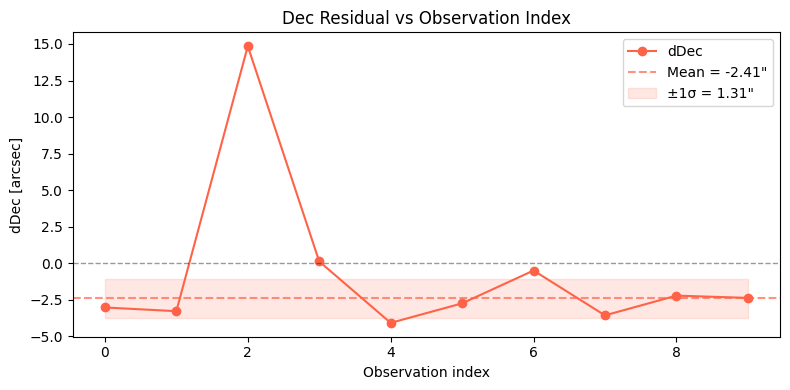

In [13]:
# Plot: dDec error vs observation index
fig, ax = plt.subplots(figsize=(8, 4))

ax.plot(t, ddec, marker='o', color='tomato', label='dDec')
ax.axhline(0, color='k', lw=1, alpha=0.4, ls='--')
ax.axhline(ddec_mu, color='tomato', lw=1.5, ls='--', alpha=0.7, label=f'Mean = {ddec_mu:.2f}"')
ax.fill_between(t, ddec_mu - ddec_std, ddec_mu + ddec_std, alpha=0.15, color='tomato', label=f'±1σ = {ddec_std:.2f}"')

ax.set_xlabel('Observation index')
ax.set_ylabel('dDec [arcsec]')
ax.set_title('Dec Residual vs Observation Index')
ax.legend()
plt.tight_layout()
plt.show()


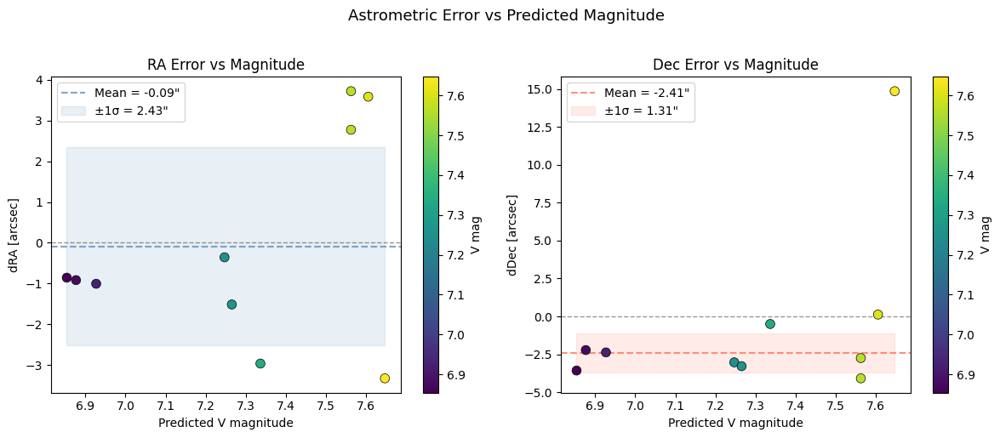

In [14]:
# Plot: dRA and dDec error vs predicted magnitude
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# dRA vs magnitude
ax = axes[0]
sc = ax.scatter(pred_mag, dra, c=pred_mag, cmap='viridis', edgecolors='k', linewidths=0.5, s=60, zorder=3)
ax.axhline(0, color='k', lw=1, alpha=0.4, ls='--')
ax.axhline(dra_mu, color='steelblue', lw=1.5, ls='--', alpha=0.7, label=f'Mean = {dra_mu:.2f}"')
ax.fill_between(sorted(pred_mag), dra_mu - dra_std, dra_mu + dra_std,
                alpha=0.12, color='steelblue', label=f'±1σ = {dra_std:.2f}"')
fig.colorbar(sc, ax=ax, label='V mag')
ax.set_xlabel('Predicted V magnitude')
ax.set_ylabel('dRA [arcsec]')
ax.set_title('RA Error vs Magnitude')
ax.legend()

# dDec vs magnitude
ax = axes[1]
sc = ax.scatter(pred_mag, ddec, c=pred_mag, cmap='viridis', edgecolors='k', linewidths=0.5, s=60, zorder=3)
ax.axhline(0, color='k', lw=1, alpha=0.4, ls='--')
ax.axhline(ddec_mu, color='tomato', lw=1.5, ls='--', alpha=0.7, label=f'Mean = {ddec_mu:.2f}"')
ax.fill_between(sorted(pred_mag), ddec_mu - ddec_std, ddec_mu + ddec_std,
                alpha=0.12, color='tomato', label=f'±1σ = {ddec_std:.2f}"')
fig.colorbar(sc, ax=ax, label='V mag')
ax.set_xlabel('Predicted V magnitude')
ax.set_ylabel('dDec [arcsec]')
ax.set_title('Dec Error vs Magnitude')
ax.legend()

plt.suptitle('Astrometric Error vs Predicted Magnitude', y=1.02, fontsize=13)
plt.tight_layout()
plt.show()


## Fitting the outliers using a Gaussian Mixter Model (GMM)


=== GMM fit: dRA ===
  Inlier  : weight=0.30  μ=3.359"  σ=0.418"
  Outlier : weight=0.70  μ=-1.562"  σ=1.053"
  Inlier points: 3   Outlier points: 7


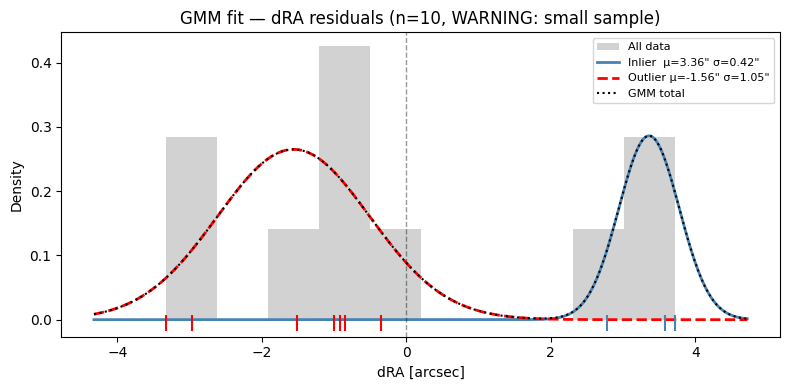


=== GMM fit: dDec ===
  Inlier  : weight=0.10  μ=14.851"  σ=0.001"
  Outlier : weight=0.90  μ=-2.408"  σ=1.312"
  Inlier points: 1   Outlier points: 9


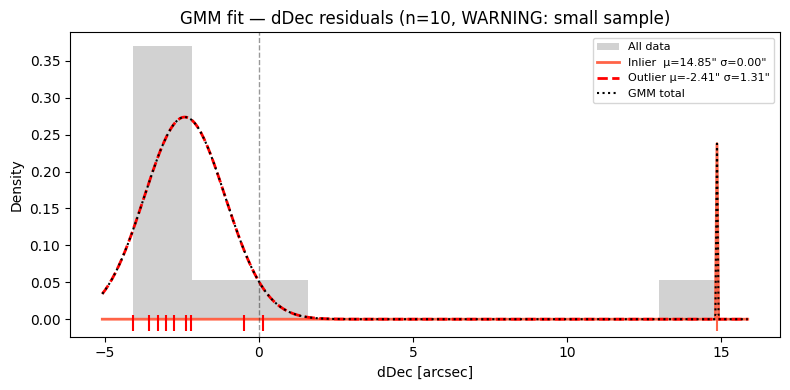

In [15]:
from sklearn.mixture import GaussianMixture
from scipy.stats import norm

def fit_gmm_1d(data, label, color_inlier='steelblue', color_outlier='red'):
    X = data.reshape(-1, 1)
    gmm = GaussianMixture(n_components=2, random_state=0)
    gmm.fit(X)

    # Sort so component 0 = tighter (inlier), component 1 = broader (outlier)
    order = np.argsort(gmm.covariances_.ravel())
    means   = gmm.means_.ravel()[order]
    stds    = np.sqrt(gmm.covariances_.ravel()[order])
    weights = gmm.weights_[order]

    labels = gmm.predict(X)
    if order[0] != 0:
        labels = 1 - labels
    inlier_mask  = labels == 0
    outlier_mask = labels == 1

    print(f"\n=== GMM fit: d{label} ===")
    print(f"  Inlier  : weight={weights[0]:.2f}  μ={means[0]:.3f}\"  σ={stds[0]:.3f}\"")
    print(f"  Outlier : weight={weights[1]:.2f}  μ={means[1]:.3f}\"  σ={stds[1]:.3f}\"")
    print(f"  Inlier points: {inlier_mask.sum()}   Outlier points: {outlier_mask.sum()}")

    x = np.linspace(data.min() - 1, data.max() + 1, 400)
    comp_inlier  = weights[0] * norm.pdf(x, means[0], stds[0])
    comp_outlier = weights[1] * norm.pdf(x, means[1], stds[1])
    mixture      = comp_inlier + comp_outlier

    fig, ax = plt.subplots(figsize=(8, 4))
    ax.hist(data, bins=10, density=True, alpha=0.35, color='grey', label='All data')
    ax.plot(x, comp_inlier,  color=color_inlier,  lw=2,
            label=f'Inlier  μ={means[0]:.2f}" σ={stds[0]:.2f}"')
    ax.plot(x, comp_outlier, color=color_outlier, lw=2, ls='--',
            label=f'Outlier μ={means[1]:.2f}" σ={stds[1]:.2f}"')
    ax.plot(x, mixture, color='k', lw=1.5, ls=':', label='GMM total')
    ax.scatter(data[inlier_mask],  np.full(inlier_mask.sum(),  -0.005),
               marker='|', s=120, color=color_inlier,  zorder=5)
    ax.scatter(data[outlier_mask], np.full(outlier_mask.sum(), -0.005),
               marker='|', s=120, color=color_outlier, zorder=5)
    ax.axvline(0, color='k', lw=1, alpha=0.4, ls='--')
    ax.set_xlabel(f'd{label} [arcsec]')
    ax.set_ylabel('Density')
    ax.set_title(f'GMM fit — d{label} residuals (n={len(data)}, WARNING: small sample)')
    ax.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

    return inlier_mask, outlier_mask, means, stds, weights


ra_inlier,  ra_outlier,  ra_means,  ra_stds,  ra_weights  = fit_gmm_1d(dra,  'RA',  'steelblue', 'red')
dec_inlier, dec_outlier, dec_means, dec_stds, dec_weights = fit_gmm_1d(ddec, 'Dec', 'tomato',     'red')


### Careful with gaussian fitting of a single poijt because the std will be zero so you get a dleta fucntion
### Sum of gaussians, there could be othrdistributions which could better be described usign laplacian foe example, GMM of a laplacianyoud find the outliers but ghey are a continuos proportion of the distribution
# therefore unclear definition of outliers
# this changes over time so the dra imagien is a gaussian bit with linear slope, if we take that nd collapse out the timeso we get a histogram then that histogram std will be artifically inflated by the slope 
# lpossibe artificial inflation due to x-dependence like PCA

## Fitting the outliers on a line
### Fitting RA

RA inlier  line : slope=-0.4057 arcsec/obs  intercept=4.9820 arcsec
RA outlier line : slope=0.0408 arcsec/obs  intercept=-1.7546 arcsec


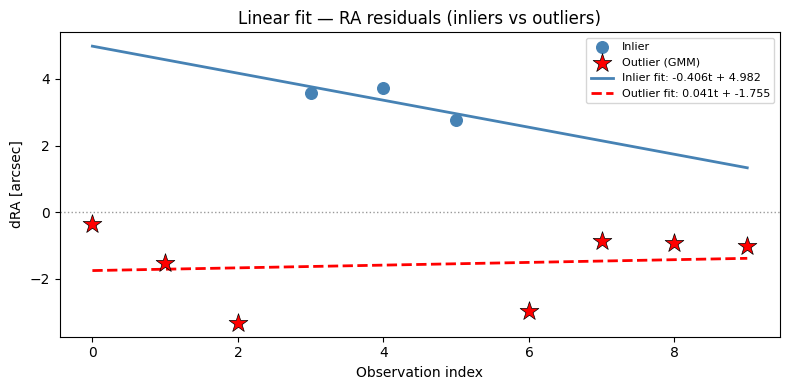

In [16]:
from numpy.polynomial import polynomial as P

t_in_ra  = t[ra_inlier]
dra_in   = dra[ra_inlier]
m_in_ra, b_in_ra = np.polyfit(t_in_ra, dra_in, 1)


t_out_ra  = t[ra_outlier]
dra_out   = dra[ra_outlier]

print(f'RA inlier  line : slope={m_in_ra:.4f} arcsec/obs  intercept={b_in_ra:.4f} arcsec')
if ra_outlier.sum() > 1:
    m_out_ra, b_out_ra = np.polyfit(t_out_ra, dra_out, 1)
    print(f'RA outlier line : slope={m_out_ra:.4f} arcsec/obs  intercept={b_out_ra:.4f} arcsec')
else:
    m_out_ra, b_out_ra = None, None
    print(f'RA outlier : only {ra_outlier.sum()} point(s) — line fit not meaningful')

# Plot
fig, ax = plt.subplots(figsize=(8, 4))
t_line = np.linspace(t.min(), t.max(), 200)

ax.scatter(t_in_ra,  dra_in,  marker='o', color='steelblue', s=70, zorder=3, label='Inlier')
ax.scatter(t_out_ra, dra_out, marker='*', color='red', s=200,
           edgecolors='k', linewidths=0.5, zorder=4, label='Outlier (GMM)')
ax.plot(t_line, m_in_ra * t_line + b_in_ra,
        color='steelblue', lw=2, label=f'Inlier fit: {m_in_ra:.3f}t + {b_in_ra:.3f}')
if m_out_ra is not None:
    ax.plot(t_line, m_out_ra * t_line + b_out_ra,
            color='red', lw=2, ls='--', label=f'Outlier fit: {m_out_ra:.3f}t + {b_out_ra:.3f}')

ax.axhline(0, color='k', lw=1, alpha=0.4, ls=':')
ax.set_xlabel('Observation index')
ax.set_ylabel('dRA [arcsec]')
ax.set_title('Linear fit — RA residuals (inliers vs outliers)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()




# x-axis time of observation instead of observation index
# use the GMM approach to determine outlier vs inlier (that way we have a mathematicla equation topint to and it is not a subjective taking)

### Fitting Dec

Dec inlier  line : slope=3.7128 arcsec/obs  intercept=7.4255 arcsec
Dec outlier line : slope=0.0464 arcsec/obs  intercept=-2.6295 arcsec


/var/folders/c5/4r_jvw5161b_6dvp_6v7p4qm0000gn/T/ipykernel_5878/3598375117.py:3: RankWarning: Polyfit may be poorly conditioned
  m_in_dec, b_in_dec = np.polyfit(t_in_dec, ddec_in, 1)


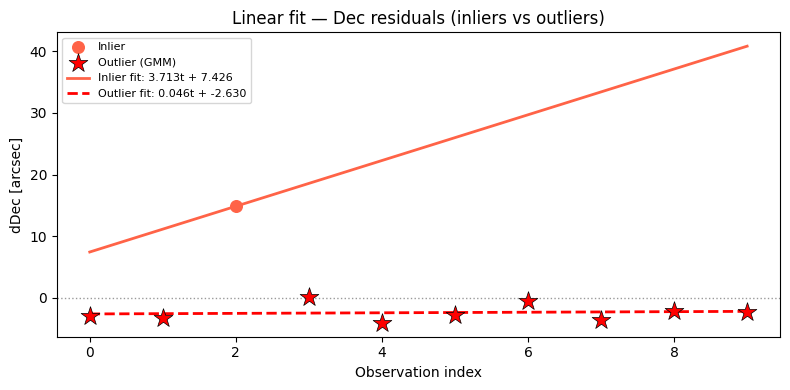

In [17]:
t_in_dec  = t[dec_inlier]
ddec_in   = ddec[dec_inlier]
m_in_dec, b_in_dec = np.polyfit(t_in_dec, ddec_in, 1)

t_out_dec  = t[dec_outlier]
ddec_out   = ddec[dec_outlier]

print(f'Dec inlier  line : slope={m_in_dec:.4f} arcsec/obs  intercept={b_in_dec:.4f} arcsec')
if dec_outlier.sum() > 1:
    m_out_dec, b_out_dec = np.polyfit(t_out_dec, ddec_out, 1)
    print(f'Dec outlier line : slope={m_out_dec:.4f} arcsec/obs  intercept={b_out_dec:.4f} arcsec')
else:
    m_out_dec, b_out_dec = None, None
    print(f'Dec outlier : only {dec_outlier.sum()} point(s) — line fit not meaningful')

# Plot
fig, ax = plt.subplots(figsize=(8, 4))
t_line = np.linspace(t.min(), t.max(), 200)

ax.scatter(t_in_dec,  ddec_in,  marker='o', color='tomato', s=70, zorder=3, label='Inlier')
ax.scatter(t_out_dec, ddec_out, marker='*', color='red', s=200,
           edgecolors='k', linewidths=0.5, zorder=4, label='Outlier (GMM)')
ax.plot(t_line, m_in_dec * t_line + b_in_dec,
        color='tomato', lw=2, label=f'Inlier fit: {m_in_dec:.3f}t + {b_in_dec:.3f}')
if m_out_dec is not None:
    ax.plot(t_line, m_out_dec * t_line + b_out_dec,
            color='red', lw=2, ls='--', label=f'Outlier fit: {m_out_dec:.3f}t + {b_out_dec:.3f}')

ax.axhline(0, color='k', lw=1, alpha=0.4, ls=':')
ax.set_xlabel('Observation index')
ax.set_ylabel('dDec [arcsec]')
ax.set_title('Linear fit — Dec residuals (inliers vs outliers)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

## Taking a loop to include _ plates
Do it for given asteroids:
- Ceres
- Bertha
- Asteroids of different bgrithnesses (one from each brightness or random ones)

